In [21]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import time
import gget
import scipy
from scipy.stats import zscore
from tqdm import tqdm
from statsmodels.stats.multitest import multipletests
from adjustText import adjust_text
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.stats import linregress

import anndata as an
import scanpy as sc
import scanpy.external as sce
import rapids_singlecell as rsc
import scvi

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

import cupy as cp
from cuml.manifold import TSNE
from cuml.decomposition import PCA

sc.settings.verbosity = 3

In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(fpath)
adata.obs['barcoded_phase'] = adata.obs['phase'].copy()
adata.X = adata.layers['log_norm'].copy()
adata

CPU times: user 424 ms, sys: 2.03 s, total: 2.45 s
Wall time: 5.13 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersio

# Nice Figures

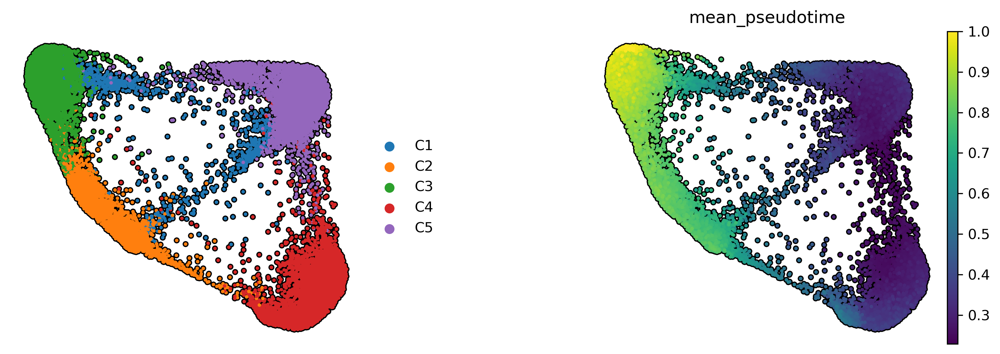

In [3]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.draw_graph(
    adata, 
    color=['cluster_str', 'mean_pseudotime'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    wspace=0.5,
)

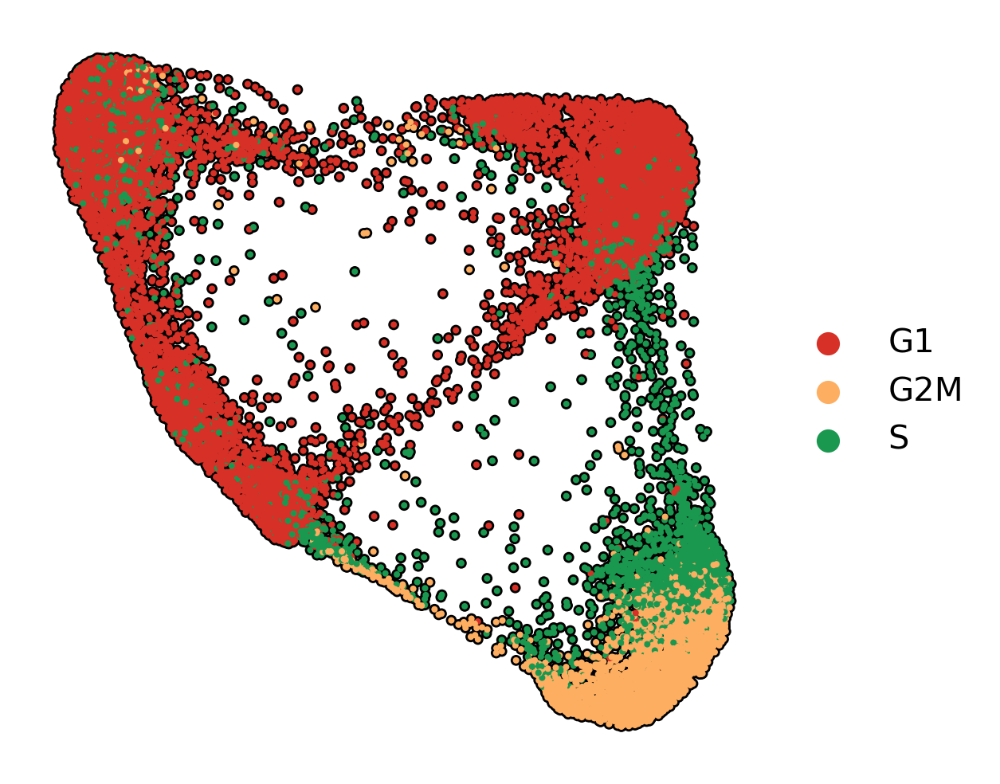

In [4]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

palette = {
    "G1": "#D73027",        # strong red (Cdt1+)
    "S": "#1A9850",         # green (Geminin+)
    "G2M": "#FDAE61",       # orange-yellow (Cdt1+/Geminin+)
    "unknown": "#B0B0B0", # Neutral gray
}

sc.pl.draw_graph(
    adata, 
    color=['phase'],
    sort_order=True,
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    na_in_legend=False,
    title="",
    frameon=False,
    wspace=0.5,
    palette=palette,
)

In [5]:
# break

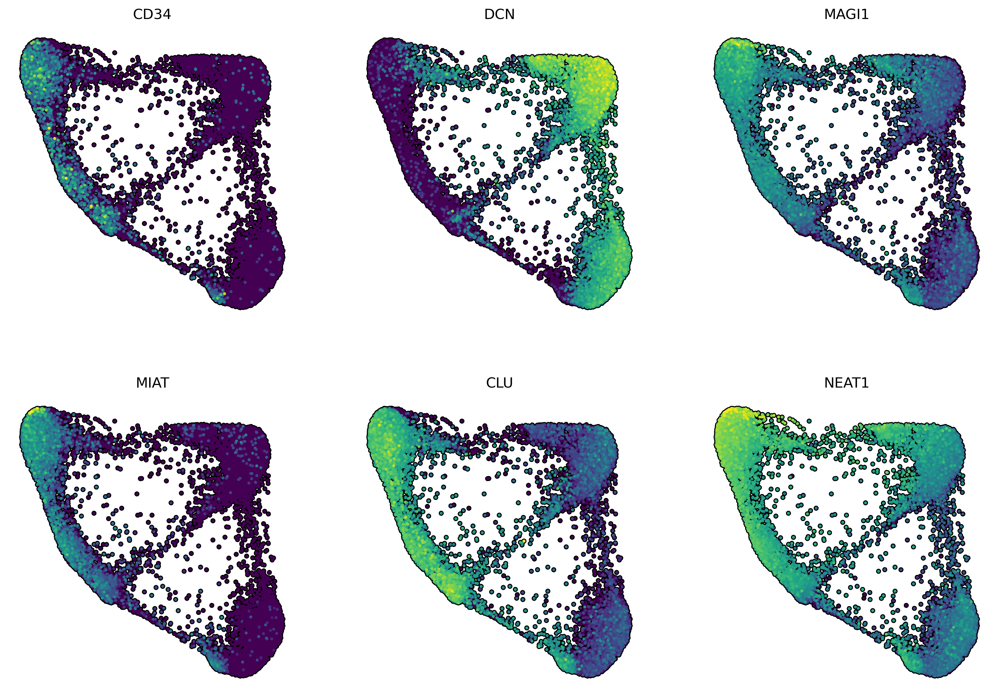

In [6]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4.75

colors = [
    'CD34', 
    'DCN',
    'MAGI1', 
    'MIAT',
    'CLU',
    'NEAT1',
]

sc.pl.draw_graph(
    adata, 
    color=colors,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    colorbar_loc=None,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
)

[INFO] Gene: CD34
[INFO] Cells with CD34 > 0: 2092
[INFO] Pearson correlation: r = 0.173, p = 1.88e-15
[INFO] Binning enabled (bin width = 0.1) with interpolation.


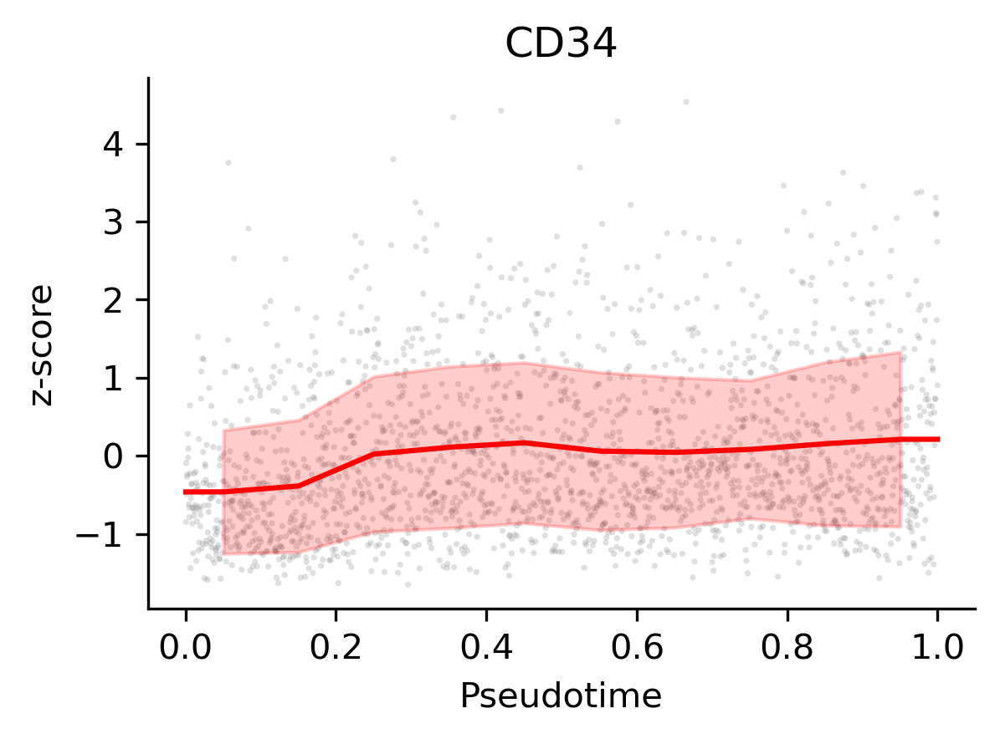

In [7]:
def plot_gene_vs_pseudotime(
    adata,
    gene,
    pseudotime_key='mean_pseudotime',
    cluster_key='cluster_str',
    plt_err=False,
    degree=1,
    filter_zero_expression=True,
    order=False,
    ax=None,
    bin=False,
    linecolor='r',
    annotate=False,
    bin_width=0.1,
):
    """Plot z-scored gene expression vs pseudotime with polynomial or binned fit + std shading and Pearson r annotation."""
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from scipy.stats import zscore, pearsonr

    # Build dataframe
    pdf = pd.DataFrame({
        'Pseudotime': adata.obs[pseudotime_key].values,
        'Cluster': adata.obs[cluster_key].values,
        gene: adata[:, gene].X.toarray().ravel(),
    })

    # Filter and z-score
    if filter_zero_expression:
        pdf = pdf[pdf[gene] > 0].copy()
    
    n_cells = len(pdf)
    pdf[f'{gene}_zscore'] = zscore(pdf[gene])
    if order:
        pdf['Pseudotime'] = pdf['Pseudotime'].rank() / len(pdf)
    pdf = pdf.sort_values(by='Pseudotime').reset_index(drop=True)

    # Pearson correlation
    x = pdf['Pseudotime'].values
    y = pdf[f'{gene}_zscore'].values
    r, p = pearsonr(y, x)

    # Print summary
    print(f"[INFO] Gene: {gene}")
    print(f"[INFO] Cells with {gene} > 0: {n_cells}")
    print(f"[INFO] Pearson correlation: r = {r:.3f}, p = {p:.2e}")
    if bin:
        print(f"[INFO] Binning enabled (bin width = {bin_width}) with interpolation.")
    else:
        print(f"[INFO] Polynomial regression (degree = {degree}) with constant std band.")

    # Prepare axis
    if ax is None:
        plt.figure(dpi=300, figsize=(4.25, 2.75))
        ax = plt.gca()

    # Scatter plot
    sns.scatterplot(
        data=pdf, 
        x='Pseudotime',
        y=f'{gene}_zscore', 
        s=3, 
        linewidth=0,
        ax=ax,
        c='grey',
        ec='none',
        alpha=0.25,
    )

    if bin:
        # Bin and interpolate
        bins = np.arange(x.min(), x.max() + bin_width, bin_width)
        bin_indices = np.digitize(x, bins)
        bin_means, bin_stds, bin_centers = [], [], []

        for b in range(1, len(bins)):
            bin_mask = bin_indices == b
            bin_data = y[bin_mask]
            if len(bin_data) > 0:
                bin_means.append(np.mean(bin_data))
                bin_stds.append(np.std(bin_data))
                bin_centers.append((bins[b - 1] + bins[b]) / 2)

        bin_means = np.array(bin_means)
        bin_stds = np.array(bin_stds)
        bin_centers = np.array(bin_centers)

        # Interpolate to original x
        y_interp = np.interp(x, bin_centers, bin_means, left=bin_means[0], right=bin_means[-1])
        y_upper = np.interp(x, bin_centers, bin_means + bin_stds, left=bin_means[0], right=bin_means[-1])
        y_lower = np.interp(x, bin_centers, bin_means - bin_stds, left=bin_means[0], right=bin_means[-1])

        ax.plot(x, y_interp, color=linecolor, linewidth=1.5, label="Binned mean (interp)")
        if plt_err:
            ax.fill_between(x, y_lower, y_upper, color=linecolor, alpha=0.2, label="±1 std")
    else:
        # Polynomial fit
        coeffs = np.polyfit(x, y, degree)
        poly = np.poly1d(coeffs)
        y_fit = poly(x)
        residuals = y - y_fit
        uncertainty = np.std(residuals)

        ax.plot(x, y_fit, color=linecolor, linewidth=1.5, label=f'Poly fit (deg={degree})')
        if plt_err:
            ax.fill_between(x, y_fit - uncertainty, y_fit + uncertainty,
                        color=linecolor, alpha=0.2, label="±1 std")

   # Annotation
    if annotate:
        ax.text(
            0.05, 0.95,
            rf"$r = {r:.2f}$ ($p = {p:.2e}$)",
            transform=ax.transAxes,
            ha='left',
            va='top',
            fontsize=9,
        )

    ax.set_xlabel('Pseudotime')
    ax.set_ylabel(f'z-score')
    ax.set_title(gene)
    sns.despine(ax=ax)

    if ax is None:
        plt.tight_layout()
        plt.show()

adata.obs['order'] = np.argsort(adata.obs['mean_pseudotime'])
plot_gene_vs_pseudotime(adata, 'CD34', order=True, bin=True, degree=3, plt_err=True)

# Analysis of DPT Genes

In [8]:
%%time
df = adata.obs.copy()

# add genes
df = pd.concat([df, adata.to_df()], axis=1)

# filter data
df = df[np.isfinite(df['dpt_pseudotime'])].copy()
df['dpt_rank'] = df['dpt_pseudotime'].rank()

results = []
for gene in tqdm(adata.var_names, desc="Computing Spearman Correlation"):
    df[gene] = df[gene].rank()
    corr, pval = scipy.stats.spearmanr(df['dpt_rank'], df[gene])
    results.append({
        'gene' : gene,
        'corr' : corr,
        'pval' : pval,
    })

results = pd.DataFrame(results)
results['adj_p_value'] = multipletests(results['pval'], method='fdr_bh')[1]
results = results.sort_values('corr', ascending=False)

print("="*20 + " Positive Correlation " + "="*20)
print(results.head(15).to_string(index=False))
print()
print("="*20 + " Negative Correlation " + "="*20)
print(results.tail(15).to_string(index=False))

Computing Spearman Correlation: 100%|██████████| 21412/21412 [01:03<00:00, 334.75it/s]

==================== Positive Correlation ====================
     gene     corr  pval  adj_p_value
    NEAT1 0.723738   0.0          0.0
  SLC12A8 0.704262   0.0          0.0
      MGP 0.674521   0.0          0.0
      CLU 0.651865   0.0          0.0
    KRT18 0.644622   0.0          0.0
    TPST2 0.635948   0.0          0.0
LINC00842 0.628195   0.0          0.0
  SLC44A1 0.623149   0.0          0.0
     RBP1 0.621671   0.0          0.0
    ABTB2 0.620074   0.0          0.0
    MAGI1 0.619990   0.0          0.0
   AHNAK2 0.616192   0.0          0.0
  TSC22D1 0.614711   0.0          0.0
     PSAP 0.614307   0.0          0.0
     MIAT 0.609631   0.0          0.0

==================== Negative Correlation ====================
  gene      corr  pval  adj_p_value
 HMGB2 -0.674614   0.0          0.0
 ISG15 -0.678672   0.0          0.0
   DUT -0.685903   0.0          0.0
 CENPF -0.689131   0.0          0.0
NUSAP1 -0.689408   0.0          0.0
 MKI67 -0.690021   0.0          0.0
 IFIT3 -0.695

In [9]:
%%time
df = adata.obs.copy()

# add genes
df = pd.concat([df, adata.to_df()], axis=1)

# filter data
df = df[np.isfinite(df['dpt_pseudotime'])].copy()
df['dpt_rank'] = df['dpt_pseudotime'].rank()

results = []
for gene in tqdm(adata.var_names, desc="Computing Pearson Correlation"):
    corr, pval = scipy.stats.pearsonr(df['dpt_pseudotime'], df[gene])
    results.append({
        'gene' : gene,
        'corr' : corr,
        'pval' : pval,
    })

results = pd.DataFrame(results)
results['adj_p_value'] = multipletests(results['pval'], method='fdr_bh')[1]
results = results.sort_values('corr', ascending=False)

print("="*20 + " Positive Correlation " + "="*20)
print(results.head(15).to_string(index=False))
print()
print("="*20 + " Negative Correlation " + "="*20)
print(results.tail(15).to_string(index=False))

Computing Pearson Correlation: 100%|██████████| 21412/21412 [00:08<00:00, 2421.04it/s]

==================== Positive Correlation ====================
     gene     corr  pval  adj_p_value
    KRT18 0.707603   0.0          0.0
      MGP 0.699537   0.0          0.0
      CLU 0.697494   0.0          0.0
    NEAT1 0.682625   0.0          0.0
  SLC12A8 0.680761   0.0          0.0
LINC00842 0.647783   0.0          0.0
  SLC44A1 0.641145   0.0          0.0
     FLNB 0.637825   0.0          0.0
    TPST2 0.630266   0.0          0.0
    MAGI1 0.616687   0.0          0.0
    KRT19 0.616672   0.0          0.0
   AHNAK2 0.615334   0.0          0.0
  TSC22D1 0.613837   0.0          0.0
    ABTB2 0.601238   0.0          0.0
   KCNMA1 0.587840   0.0          0.0

==================== Negative Correlation ====================
  gene      corr  pval  adj_p_value
 PTTG1 -0.707118   0.0          0.0
 IFIT3 -0.709777   0.0          0.0
 ISG15 -0.714355   0.0          0.0
  PRC1 -0.719888   0.0          0.0
  TPX2 -0.720543   0.0          0.0
   DUT -0.722708   0.0          0.0
  TMPO -0.728

# Plot to correlated genes

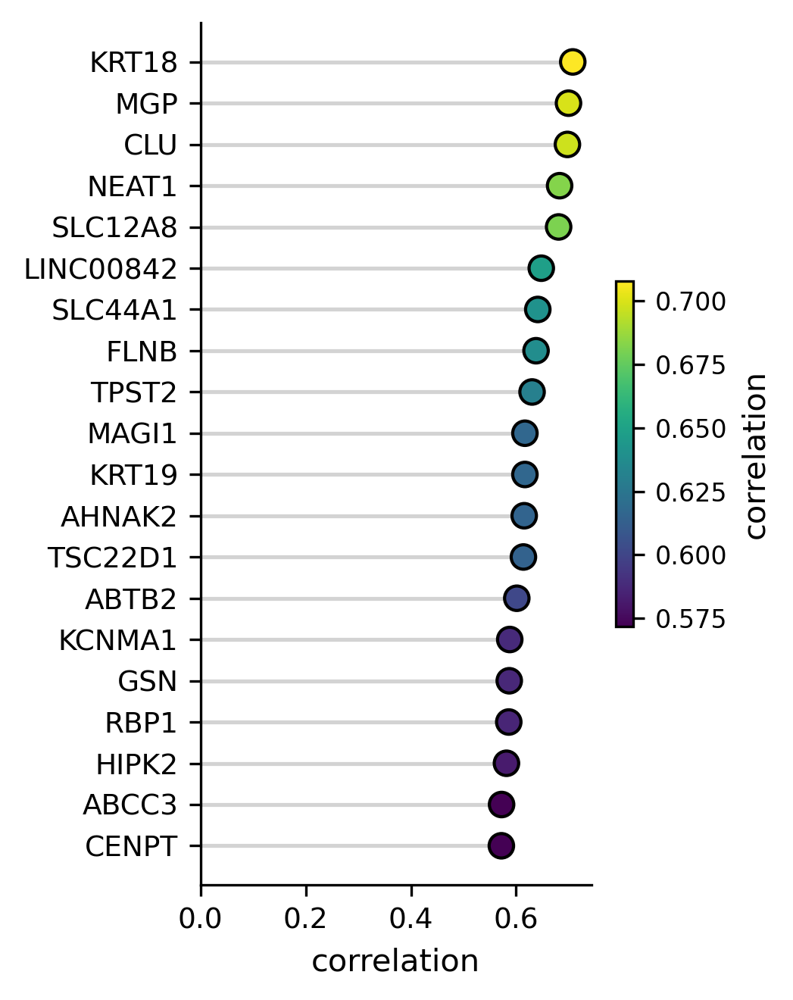

In [10]:
top_n = 20
top = results.nlargest(top_n, 'corr').copy()
top = top.sort_values("corr")  # ensure genes are in order from low to high

plt.figure(figsize=(3.5, 4.5))
ax = plt.gca()

# Draw lines from y-axis to each dot (baseline = 0)
for i, (gene, corr) in enumerate(zip(top['gene'], top['corr'])):
    ax.hlines(
        y=i,
        xmin=0,
        xmax=corr,
        color='lightgray',
        linewidth=1.25,
        zorder=0,
    )

# Draw the dots
scatter = ax.scatter(
    top['corr'],
    range(len(top)),
    c=top['corr'],
    cmap='viridis',
    edgecolor='black',
    s=60,
    zorder=3,
)

# Format axes
ax.set_yticks(range(len(top)))
ax.set_yticklabels(top['gene'], fontsize=9)
ax.set_xlabel("correlation")
ax.set_ylabel("")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(0.8)
ax.spines['bottom'].set_linewidth(0.8)
ax.tick_params(axis='x', labelsize=9)
ax.set_xlim(0, top['corr'].max() * 1.05)

# Optional colorbar
cbar = plt.colorbar(scatter, ax=ax, shrink=0.4,)
cbar.set_label("correlation")
cbar.ax.tick_params(labelsize=8)

plt.tight_layout()
plt.show()

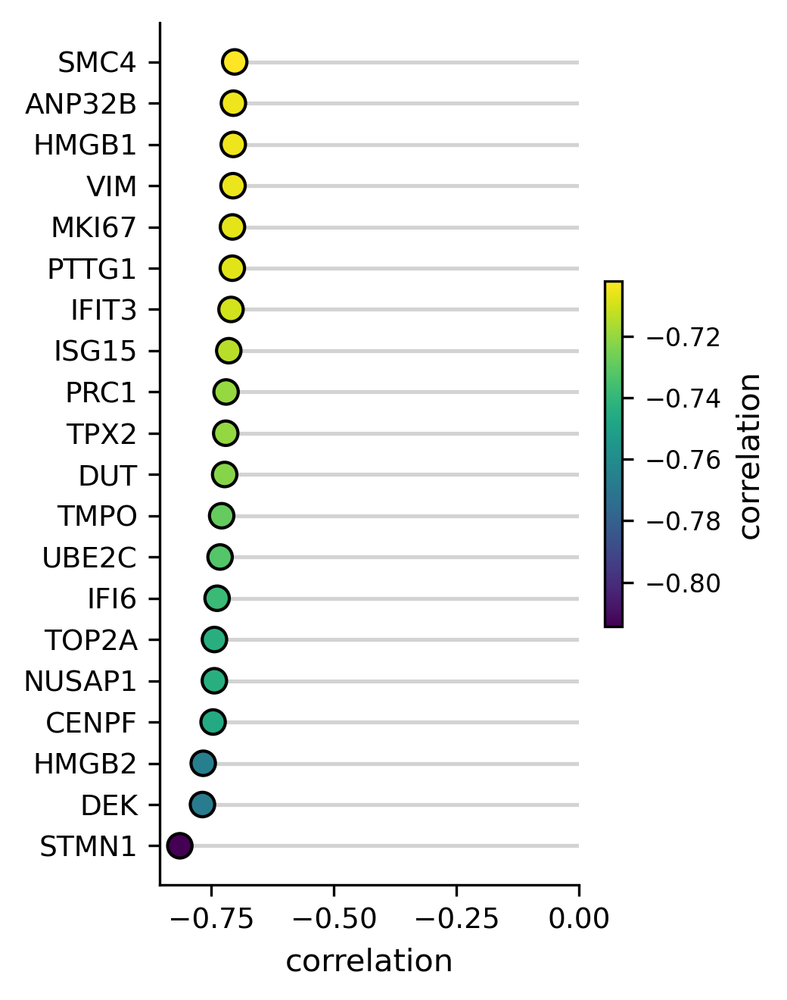

In [11]:
top_n = 20
top = results.nsmallest(top_n, 'corr').copy()
top = top.sort_values("corr")  # ensure genes are in order from most negative to less negative

plt.figure(figsize=(3.5, 4.5))
ax = plt.gca()

# Draw lines from y-axis to each dot (baseline = 0)
for i, (gene, corr) in enumerate(zip(top['gene'], top['corr'])):
    ax.hlines(
        y=i,
        xmin=0,
        xmax=corr,
        color='lightgray',
        linewidth=1.25,
        zorder=0,
    )

# Draw the dots
scatter = ax.scatter(
    top['corr'],
    range(len(top)),
    c=top['corr'],
    cmap='viridis',
    edgecolor='black',
    s=60,
    zorder=3,
)

# Format axes
ax.set_yticks(range(len(top)))
ax.set_yticklabels(top['gene'], fontsize=9)
ax.set_xlabel("correlation")
ax.set_ylabel("")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(0.8)
ax.spines['bottom'].set_linewidth(0.8)
ax.tick_params(axis='x', labelsize=9)
ax.set_xlim(top['corr'].min() * 1.05, 0)

# Optional colorbar
cbar = plt.colorbar(scatter, ax=ax, shrink=0.4)
cbar.set_label("correlation")
cbar.ax.tick_params(labelsize=8)

plt.tight_layout()
plt.show()


# TF Analysis

In [12]:
# load tf list
fpath = "../../resources/allTFs_hg38.txt"
tf_list = [x.strip() for x in open(fpath)]
print(f"{len(tf_list)=}")


tdf = results[results['gene'].isin(tf_list)]
print("="*20 + " Positive Correlation " + "="*20)
print(tdf.head(15).to_string(index=False))
print()
print("="*20 + " Negative Correlation " + "="*20)
print(tdf.tail(15).to_string(index=False))

len(tf_list)=1892
==================== Positive Correlation ====================
    gene     corr  pval  adj_p_value
   ZFHX3 0.540098   0.0          0.0
   PRDX5 0.498340   0.0          0.0
   NFAT5 0.483960   0.0          0.0
   NCOA3 0.462311   0.0          0.0
     REL 0.430592   0.0          0.0
  SETBP1 0.408713   0.0          0.0
    CUX1 0.404254   0.0          0.0
   KDM4C 0.403713   0.0          0.0
  MLLT10 0.402217   0.0          0.0
   GLIS3 0.390974   0.0          0.0
   FOXN3 0.390320   0.0          0.0
  ZNF516 0.386652   0.0          0.0
    MSI2 0.368112   0.0          0.0
GTF2IRD1 0.367082   0.0          0.0
  ZNF827 0.365126   0.0          0.0

==================== Negative Correlation ====================
   gene      corr  pval  adj_p_value
   MXD3 -0.441884   0.0          0.0
  RPL35 -0.450276   0.0          0.0
  MYBL1 -0.450474   0.0          0.0
    NMI -0.457189   0.0          0.0
  HSPA5 -0.462015   0.0          0.0
   YBX1 -0.465985   0.0          0.0
  DN

/tmp/ipykernel_3401778/2365530775.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf['y_jitter'] = np.random.normal(loc=0, scale=0.1, size=len(tdf))
Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


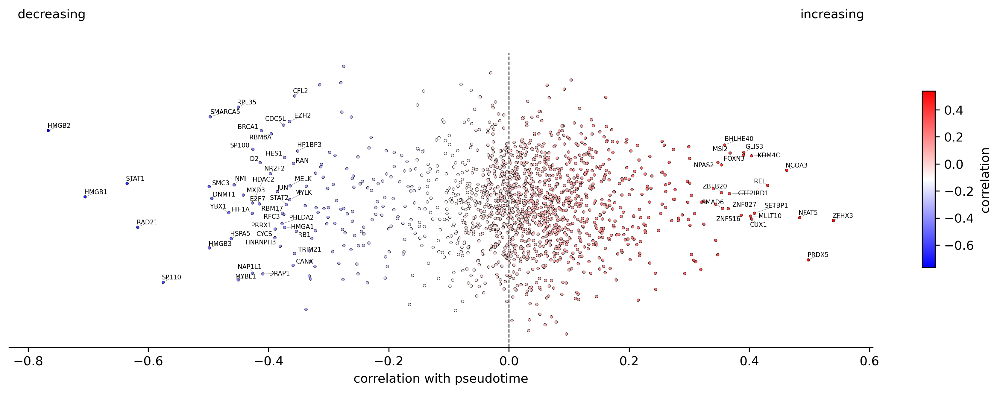

In [13]:
# Manually create jittered y-values
tdf['y_jitter'] = np.random.normal(loc=0, scale=0.1, size=len(tdf))

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 4), dpi=300)

# Plot scatter
sc = sns.scatterplot(
    data=tdf,
    x='corr',
    y='y_jitter',
    hue='corr',
    palette='bwr',
    edgecolor='k',
    linewidth=0.25,
    s=5,
    legend=False,
    zorder=3,
    ax=ax
)

# Annotate genes with large correlations
texts = []
target_x = []
target_y = []
for _, row in tdf[abs(tdf['corr']) > 0.35].iterrows():
    texts.append(ax.text(
        row['corr'],
        row['y_jitter'],
        row['gene'],
        fontsize=5,
        ha='center',
        va='bottom',
        zorder=4
    ))
    target_x.append(row['corr'])
    target_y.append(row['y_jitter'])

adjust_text(
    texts,
    target_x=target_x,
    target_y=target_y,
    expand_text=(0, 10),
    avoid_self=True,
    ax=ax,
    arrowprops=dict(arrowstyle='-', lw=0.3, color='gray'),
)

# Add colorbar centered on right margin
norm = Normalize(vmin=tdf['corr'].min(), vmax=tdf['corr'].max())
sm = ScalarMappable(cmap='bwr', norm=norm)
sm.set_array([])

# Use bbox_to_anchor to shift right
cax = inset_axes(
    ax,
    width="1.5%", height="60%",
    bbox_to_anchor=(1.05, 0.25, 1, 1),  # (x0, y0, width, height) in axes fraction
    bbox_transform=ax.transAxes,
    loc='lower left'
)
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label('correlation')

# Plot formatting
ax.axvline(x=0, c='k', lw=0.75, ls='--', zorder=0)
ax.set_xlabel('correlation with pseudotime')
ax.set_ylabel('')
ax.set_yticks([])
sns.despine(left=True)
plt.tight_layout()

# Direction labels
ax.text(0.01, 1.15, "decreasing", transform=ax.transAxes, ha='left', va='top', fontsize=10)
ax.text(0.99, 1.15, "increasing", transform=ax.transAxes, ha='right', va='top', fontsize=10)

plt.show()

In [14]:
# database = 'ontology'
# database = 'celltypes'
database = 'celltypes'
n_query = 100

edf = gget.enrichr(tdf['gene'].head(n_query).to_list(), database=database)
# edf = gget.enrichr(tdf['gene'].tail(n_query).to_list(), database=database)

# edf = gget.enrichr(results['gene'].head(n_query).to_list(), database=database)
# edf = gget.enrichr(results['gene'].tail(n_query).to_list(), database=database)

edf['overlap'] = edf['overlapping_genes'].apply(lambda x: len(x) / n_query)
edf['genes'] = edf['overlapping_genes'].apply(lambda x: ",".join(x))
edf = edf[['path_name', 'adj_p_val', 'overlap', 'genes']]
print(edf.head().to_string(index=False))

12:29:56 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


                   path_name  adj_p_val  overlap                          genes
        Embryonic Stem Cells   0.116709     0.05 SMAD3,RBFOX2,NR6A1,BCL3,CTNNB1
  Adipocyte Progenitor Cells   0.515749     0.03            TCF7L1,TWIST2,PPARG
             Microfold Cells   0.515749     0.03              NFIC,BHLHE40,BCL3
                  Osteocytes   0.604333     0.02                  ZNF462,TCF7L1
Trophoblast Progenitor Cells   0.604333     0.02                    TFAP2C,BCL3


In [15]:
# break

[INFO] Gene: TSPAN9
[INFO] Cells with TSPAN9 > 0: 15591
[INFO] Pearson correlation: r = -0.750, p = 0.00e+00
[INFO] Polynomial regression (degree = 1) with constant std band.
[INFO] Gene: FLNB
[INFO] Cells with FLNB > 0: 8995
[INFO] Pearson correlation: r = 0.720, p = 0.00e+00
[INFO] Polynomial regression (degree = 1) with constant std band.
[INFO] Gene: EGFR
[INFO] Cells with EGFR > 0: 11090
[INFO] Pearson correlation: r = 0.470, p = 0.00e+00
[INFO] Polynomial regression (degree = 1) with constant std band.
[INFO] Gene: CBFA2T2
[INFO] Cells with CBFA2T2 > 0: 5425
[INFO] Pearson correlation: r = 0.269, p = 1.36e-90
[INFO] Polynomial regression (degree = 1) with constant std band.
[INFO] Gene: AHNAK
[INFO] Cells with AHNAK > 0: 14355
[INFO] Pearson correlation: r = 0.547, p = 0.00e+00
[INFO] Polynomial regression (degree = 1) with constant std band.


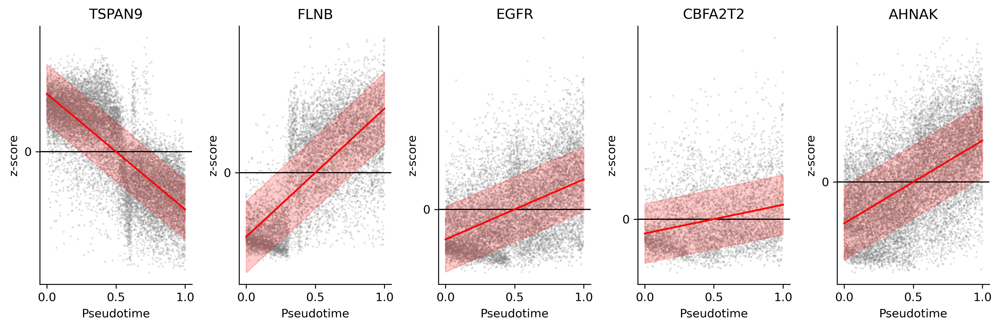

In [16]:
genes = [
    "TSPAN9",
    "FLNB",     # Endothelial/HSC – Surface glycoprotein, marks endothelial progenitors and HSCs
    "EGFR",     # Endothelial – Growth factor receptor, active in vasculature and epithelium
    "CBFA2T2",  # HSC – Corepressor interacting with RUNX1, active in early hematopoiesis
    "AHNAK",    # HSC – Large scaffolding protein, roles in early HSC development (context-dependent)
]


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 12, 4
fig, axs = plt.subplots(1, 5)
axs = axs.ravel()

for i, gene in enumerate(genes):
    axs[i].axhline(y='0', lw=1, c='k')
    
    plot_gene_vs_pseudotime(
        adata, 
        gene, 
        degree=1,
        order=True, 
        plt_err=True,
        ax=axs[i], 
        linecolor='r',
    )


plt.tight_layout()

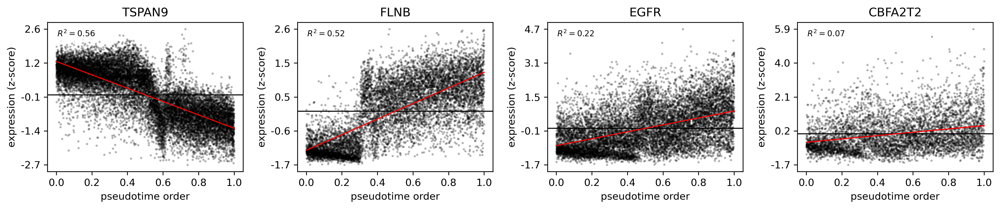

In [58]:
genes = [
    "TSPAN9",
    "FLNB",     # Endothelial/HSC – Surface glycoprotein, marks endothelial progenitors and HSCs
    "EGFR",     # Endothelial – Growth factor receptor, active in vasculature and epithelium
    "CBFA2T2",  # HSC – Corepressor interacting with RUNX1, active in early hematopoiesis
]


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 14, 3
fig, axs = plt.subplots(1, 4)
axs = axs.ravel()

for i, gene in enumerate(genes):
    axs[i].axhline(y='0', lw=1, c='k')

    # Build dataframe
    pdf = pd.DataFrame({
        'pseudotime' : adata.obs['mean_pseudotime'].values,
        'cluster' : adata.obs['cluster_str'].values,
        'expression' : adata[:, gene].X.toarray().ravel(),
    })

    # filter zero expression
    pdf = pdf[pdf['expression'] > 0].copy()
    
    pdf[f'zscore'] = zscore(pdf['expression'])
    pdf['order'] = pdf['pseudotime'].rank() / len(pdf)
    pdf = pdf.sort_values(by='pseudotime').reset_index(drop=True)

    # Compute regression
    slope, intercept, r_value, p_value, std_err = linregress(pdf['order'], pdf['zscore'])

    # Plot with regression line and CI
    sns.regplot(
        data=pdf,
        x='order',
        y='zscore',
        scatter_kws={'s': 2, 'color': 'k', 'alpha': 0.2},
        line_kws={'color': 'r', 'lw':1},
        # lowess=True,
        # x_bins=50,
        n_boot=100,
        ax=axs[i],
    )
    
    # Annotate regression stats
    axs[i].text(
        0.05, 0.95,
        f"$R^2 = {r_value**2:.2f}$",
        transform=axs[i].transAxes,
        verticalalignment='top',
        fontsize=8,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
    )

    yticks = np.linspace(pdf['zscore'].min(), pdf['zscore'].max(), 5)
    yticklabels = [f"{y:.1f}" for y in yticks]
    axs[i].set_yticks(yticks)
    axs[i].set_yticklabels(yticklabels)

    axs[i].set_title(gene)
    axs[i].set_ylabel('expression (z-score)')
    axs[i].set_xlabel('pseudotime order')


plt.tight_layout()

In [ ]:
break

In [ ]:
genes = [
    "DCN",
    "LUM", 
    "FSTL1",
    "TSPAN9",

    "FLNB",     # Endothelial/HSC – Surface glycoprotein, marks endothelial progenitors and HSCs
    "HEG1",     # Endothelial – Transmembrane protein enriched in vascular endothelium
    "EGFR",     # Endothelial – Growth factor receptor, active in vasculature and epithelium
    "FBLN2",    # Endothelial – ECM glycoprotein, expressed in endothelial and stromal compartments

    "CBFA2T2",  # HSC – Corepressor interacting with RUNX1, active in early hematopoiesis
    "TPST2",    # HSC – Tyrosylprotein sulfotransferase, implicated in hematopoietic cell signaling
    "AHNAK",    # HSC – Large scaffolding protein, roles in early HSC development (context-dependent)
    "PSAP",     # HSC – Prosaposin, lysosomal protein involved in HSC maintenance under stress
]


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 12, 6
fig, axs = plt.subplots(3, 4, sharex=True)
axs = axs.ravel()

for i, gene in enumerate(genes):
    axs[i].axhline(y='0', lw=1, c='k')
    
    plot_gene_vs_pseudotime(
        adata, 
        gene, 
        degree=2,
        order=True, 
        bin=True, 
        plt_err=True,
        ax=axs[i], 
        linecolor='r',
    )


plt.tight_layout()

In [ ]:
break

# Marker Genes

In [ ]:
def load_pathway(fpath):
    """
    Loads an Enrichr-like database file into a boolean DataFrame.

    Args:
        fpath (str): Path to the Enrichr-like database file.

    Returns:
        pandas.DataFrame: A boolean DataFrame where:
            - Index: Genes
            - Columns: Pathways
            - Values: True if the gene is in the pathway, False otherwise.
    """

    result = []
    with open(fpath,  encoding='utf-8') as f:
        for line in f:
            split_line = [x for x in line.strip().split('\t') if x]  # Remove empty strings directly

            row = {'label': split_line[0]}
            for gene in split_line[1:]:
                row[gene] = 1

            result.append(row)

    df = pd.DataFrame(result)
    df = df.fillna(0.0).set_index('label').astype(bool).T  # Chained operations for clarity

    return df

fpath = "../../resources/PanglaoDB_Augmented_2021.txt"
pdf = load_pathway(fpath)
cell_types = ['Hematopoietic Stem Cells', 'Endothelial Cells', 'Fibroblasts']

results = []

for ct in cell_types:
    marker_genes = list(pdf[pdf[ct]].index)

    qdf = score_df.copy()
    qdf = qdf[qdf['significant']]
    qdf = qdf[qdf['gene'].isin(marker_genes)]
    qdf['marker_type'] = ct
    results.append(qdf)
       
results = pd.concat(results)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(2.25, 4.75))
ax = sns.boxplot(
    data=results,
    x='marker_type',
    y='correlation',
    palette='colorblind',
    width=0.6,
    linewidth=1.0,
    fliersize=3,
    boxprops=dict(edgecolor='black'),
    whiskerprops=dict(color='black'),
    capprops=dict(color='black'),
    medianprops=dict(color='black'),
)

# Overlay individual points
sns.stripplot(
    data=results,
    x='marker_type',
    y='correlation',
    color='black',
    size=1,
    jitter=True,
    dodge=False,
    alpha=0.6,
    ax=ax
)

# Axis formatting
ax.set_xlabel("Marker type", fontsize=11)
ax.set_ylabel("correlation", fontsize=11)
ax.tick_params(axis='x', labelrotation=90, labelsize=9)
ax.tick_params(axis='y', labelsize=9)

# Clean spines
sns.despine()
# ax.spines['left'].set_linewidth(0.8)
# ax.spines['bottom'].set_linewidth(0.8)

plt.tight_layout()
plt.show()


results.head()

In [ ]:
n_genes = 16

for ct in cell_types:
    marker_genes = list(pdf[pdf[ct]].index)

    qdf = score_df.copy()
    qdf = qdf[qdf['significant']]
    qdf = qdf[qdf['gene'].isin(marker_genes)]

    qdf = qdf.sort_values('correlation', ascending=False)
    qdf = pd.concat([qdf.head(8), qdf.tail(8)])

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 12, 12
    fig, axs = plt.subplots(4, 4, sharex=True)
    axs = axs.ravel()

    for i, (_, row) in enumerate(qdf.iterrows()):
        gene = row['gene']
        linecolor = "darkgreen"
        if row['correlation'] < 0:
            linecolor="r"
            
        plot_gene_vs_pseudotime(
            adata, 
            gene, 
            degree=3,
            ax=axs[i], 
            linecolor=linecolor,
            bin=True,
        )

    plt.suptitle(ct, y=1.01)
    plt.tight_layout()
    plt.show()

In [ ]:
break

In [ ]:
fpath = "../../resources/Tabula_Sapiens.txt"
pdf = load_pathway(fpath)

search_types = {
    'hemat' : 'HSC',
    'fibroblast' : 'Fibroblast',
    'endoth' : 'Endothelial',
}

search_terms = {}
for search, label in search_types.items():
    search_terms[label] = [x for x in pdf.columns if search in x.lower()]

print(search_terms)
results = []
for label, columns in search_terms.items():
    marker_genes = list(pdf[pdf[columns].any(axis=1)].index)
    qdf = score_df.copy()
    qdf = qdf[qdf['significant']]
    qdf = qdf[qdf['gene'].isin(marker_genes)]
    qdf['marker_type'] = label
    results.append(qdf)
       
results = pd.concat(results)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(2.25, 4.75))
ax = sns.boxplot(
    data=results,
    x='marker_type',
    y='correlation',
    palette='colorblind',
    width=0.6,
    linewidth=1.0,
    fliersize=3,
    boxprops=dict(edgecolor='black'),
    whiskerprops=dict(color='black'),
    capprops=dict(color='black'),
    medianprops=dict(color='black'),
)

# Overlay individual points
sns.stripplot(
    data=results,
    x='marker_type',
    y='correlation',
    color='black',
    size=1,
    jitter=True,
    dodge=False,
    alpha=0.6,
    ax=ax
)

# Axis formatting
ax.set_xlabel("Marker type", fontsize=11)
ax.set_ylabel("correlation", fontsize=11)
ax.tick_params(axis='x', labelrotation=90, labelsize=9)
ax.tick_params(axis='y', labelsize=9)

# Clean spines
sns.despine()
# ax.spines['left'].set_linewidth(0.8)
# ax.spines['bottom'].set_linewidth(0.8)

plt.tight_layout()
plt.show()


results.head()
    

In [ ]:
break